In [1]:
import os
from glob import glob
import numpy as np
import dask
import xarray as xr
import cartopy.crs as ccrs
from cmocean import cm
import xgcm

from matplotlib import pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = 20, 12

from mitequinox.utils import *
from dask import compute, delayed

/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.6/site-packages/cmocean/tools.py:76: MatplotlibDeprecationWarning: The is_string_like function was deprecated in version 2.1.
  if not mpl.cbook.is_string_like(rgbin[0]):
/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)
/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)


In [2]:
from dask_jobqueue import PBSCluster
local_dir = os.getenv('TMPDIR')
cluster = PBSCluster(local_directory=local_dir)
#print(cluster.job_script())
w = cluster.start_workers(30)

/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.6/site-packages/distributed/utils.py:128: RuntimeWarning: Couldn't detect a suitable IP address for reaching '8.8.8.8', defaulting to '127.0.0.1': [Errno 101] Network is unreachable
  % (host, default, e), RuntimeWarning)


In [3]:
# get dask handles and check dask server status
from dask.distributed import Client
client = Client(cluster)

In [4]:
client

Client Scheduler: tcp://10.148.0.217:49291 Dashboard: http://10.148.0.217:8787/status,Cluster Workers: 60 Cores: 240 Memory: 3000.00 GB


_________
# Read dataset


### 1.1 NetCDF data

In [11]:
Nf = 720

data_dir = '/home1/scratch/xyu/mit_nc_t/'

filenames_Eta = sorted(glob(data_dir+'Eta_*.nc'))
filenames_Eta = filenames_Eta[:Nf]
%time ds_Eta = xr.open_mfdataset(filenames_Eta, concat_dim='time', compat='equals', decode_cf=False)

filenames_SSU = sorted(glob(data_dir+'SSU_*.nc'))
filenames_SSU = filenames_SSU[:Nf]
%time ds_SSU = xr.open_mfdataset(filenames_SSU, concat_dim='time', compat='equals', decode_cf=False)

filenames_SSV = sorted(glob(data_dir+'SSV_*.nc'))
filenames_SSV = filenames_SSV[:Nf]
%time ds_SSV = xr.open_mfdataset(filenames_SSV, concat_dim='time', compat='equals', decode_cf=False)

%time grid = xr.open_dataset('/home1/scratch/xyu/mit_grid.nc', decode_coords=True)

%time ds = xr.merge([ds_SSU, ds_SSV, grid])
print(ds)
print('\n data size: %.1f GB' %(ds.nbytes / 1e9))
print('\n data size (1 face): %.1f GB' %(ds['Eta'].nbytes / 1e9))


CPU times: user 7.69 s, sys: 3.84 s, total: 11.5 s
Wall time: 1min 28s
CPU times: user 7.61 s, sys: 3.69 s, total: 11.3 s
Wall time: 1min 26s
CPU times: user 24 ms, sys: 12 ms, total: 36 ms
Wall time: 300 ms
CPU times: user 9.01 s, sys: 376 ms, total: 9.38 s
Wall time: 13.8 s
<xarray.Dataset>
Dimensions:  (face: 13, i: 4320, i_g: 4320, j: 4320, j_g: 4320, time: 720)
Coordinates:
  * i_g      (i_g) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 ...
  * j        (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * face     (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
  * time     (time) float64 5.702e+06 5.706e+06 5.71e+06 5.713e+06 5.717e+06 ...
  * i        (i) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * j_g      (j_g) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 ...
    XC       (face, j, i) float32 ...
    YC       (face, j, i) float32 ...
    XG       (face, j_g, i_g) float32 ...
    YG       (face, j_g, i_g) float32 ...
    

KeyError: 'Eta'

### 1.2 Zarr data_each hour

In [5]:
data_dir = '/home1/scratch/xyu/mit_zarr/'

In [12]:
Nf = 20

D = [xr.open_zarr(data_dir+'Eta/Eta_t%04d.zarr'%(t), decode_cf=False) for t in range(Nf)]
ds_Eta = xr.concat(D, dim='time')
vdrop = ['CS','SN','dtime']
ds_Eta = ds_Eta.drop(vdrop)

D = [xr.open_zarr(data_dir+'SSU/SSU_t%04d.zarr'%(t), decode_cf=False) for t in range(Nf)]
ds_SSU = xr.concat(D, dim='time')
vdrop = ['dtime']
ds_SSU = ds_SSU.drop(vdrop)

D = [xr.open_zarr(data_dir+'SSV/SSV_t%04d.zarr'%(t), decode_cf=False) for t in range(Nf)]
ds_SSV = xr.concat(D, dim='time')
vdrop = ['dtime']
ds_SSV = ds_SSV.drop(vdrop)

grid = xr.open_zarr('/home1/scratch/xyu/mit_grid.zarr')
#grid = xr.open_dataset('/home1/scratch/xyu/mit_grid.nc', decode_coords=True)

In [13]:
%time ds = xr.merge([ds_Eta, ds_SSU, ds_SSV, grid])
print(ds)
print('\n data size: %.1f GB' %(ds.nbytes / 1e9))

CPU times: user 4 ms, sys: 0 ns, total: 4 ms
Wall time: 3.79 ms
<xarray.Dataset>
Dimensions:  (face: 13, i: 4320, i_g: 4320, j: 4320, j_g: 4320, time: 20)
Coordinates:
  * face     (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
  * i        (i) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * j        (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * time     (time) float64 5.702e+06 5.706e+06 5.71e+06 5.713e+06 5.717e+06 ...
  * i_g      (i_g) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 ...
  * j_g      (j_g) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 ...
    XC       (face, j, i) float32 ...
    YC       (face, j, i) float32 ...
    XG       (face, j_g, i_g) float32 ...
    YG       (face, j_g, i_g) float32 ...
    CS       (face, j, i) float32 ...
    SN       (face, j, i) float32 ...
    rA       (face, j, i) float32 ...
    dxG      (face, j_g, i) float32 ...
    dyG      (face, j, i_g) float32 ...
    Depth    (face, j, i

### 1.3 Zarr data_each face

In [5]:
data_dir = '/home1/scratch/xyu/mit_zarr/'
face_all = 13

D = [xr.open_zarr(data_dir+'SSU_rotation_f%02d.zarr'%(face)) for face in range(face_all)]
ds_SSU = xr.concat(D, dim='face')

D = [xr.open_zarr(data_dir+'SSV_rotation_f%02d.zarr'%(face)) for face in range(face_all)]
ds_SSV = xr.concat(D, dim='face')

D = [xr.open_zarr(data_dir+'Eta_f%02d.zarr'%(face)) for face in range(face_all)]
ds_Eta = xr.concat(D, dim='face')

#grid = xr.open_zarr('/home1/scratch/xyu/mit_grid.zarr')
grid = xr.open_dataset('/home1/scratch/xyu/mit_grid.nc', decode_coords=True)

In [6]:
%time ds = xr.merge([ds_Eta, ds_SSU, ds_SSV, grid])
print(ds)
print('\n data size: %.1f GB' %(ds.nbytes / 1e9))
print('\n data size (1 face): %.1f GB' %(ds['Eta'].nbytes / 1e9))

CPU times: user 8 ms, sys: 0 ns, total: 8 ms
Wall time: 7.46 ms
<xarray.Dataset>
Dimensions:       (face: 13, i: 4320, i_g: 4320, j: 4320, j_g: 4320, time: 720)
Coordinates:
  * face          (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
    dtime         (time) datetime64[ns] 2011-11-15 2011-11-15T01:00:00 ...
  * i             (i) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 ...
  * j             (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 ...
  * time          (time) float64 5.702e+06 5.706e+06 5.71e+06 5.713e+06 ...
  * i_g           (i_g) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 ...
  * j_g           (j_g) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 ...
    XC            (face, j, i) float32 ...
    YC            (face, j, i) float32 ...
    XG            (face, j_g, i_g) float32 ...
    YG            (face, j_g, i_g) float32 ...
    CS            (face, j, i) float32 ...
    SN            (face, j, i) float32 ...
    rA            (face, j, i

In [7]:
E_dir = '/home1/scratch/xyu/momentum/'

---


# 1. Time derivative of SSU ($G_u$)

A central difference is applied to compute du/dt.

In [25]:
for face in range(ds['face'].size):
    
    d_SSU_dt_time = ( ds['SSU_rotation'].isel(face=face).shift(time=-1) - ds['SSU_rotation'].isel(face=face).shift(time=1) )/2/3600
    d_SSU_dt_time = d_SSU_dt_time.rename('d_SSU_dt_time')
    d_SSU_dt_time = d_SSU_dt_time.chunk({'time': 1,'i_g':4320,'j':4320})
    
    d_SSU_dt_time.to_dataset().to_zarr(E_dir+'d_SSU_dt_f%02d.zarr'% (face), mode='w')
    print('face=%d - allready processed'%(face))

face=0 - allready processed
face=1 - allready processed
face=2 - allready processed
face=3 - allready processed
face=4 - allready processed
face=5 - allready processed
face=6 - allready processed
face=7 - allready processed
face=8 - allready processed
face=9 - allready processed
face=10 - allready processed
face=11 - allready processed
face=12 - allready processed


_______

# 2. Coriolis terms ($G_u^{fv}$)

Next we create a `Grid` object from the dataset.
We need to tell xgcm that the `X` and `Y` axes are periodic.
(The other axes will be assumed to be non-periodic.)

In [8]:
grid = xgcm.Grid(ds, periodic=['X', 'Y'])
grid

<xgcm.Grid>
Y Axis (periodic):
  * center   j (4320) --> left
  * left     j_g (4320) --> center
X Axis (periodic):
  * center   i (4320) --> left
  * left     i_g (4320) --> center

In [9]:
lat = ds['YG']
omega = 7.3/100000
f = 2*omega*np.sin(np.deg2rad(lat))
f_j = grid.interp(f,'Y')
f_i = grid.interp(f,'X')

In [28]:
for face in range(ds['face'].size):

    dxgSSV_j = grid.interp(ds.dxG.isel(face=face) * ds['SSV_rotation'].isel(face=face),'Y') 
    dxgSSV_ji = grid.interp(dxgSSV_j,'X')    # SSV at (i_g,j)
    zeta_3 = (grid.diff(ds.dyC.isel(face=face) * ds['SSV_rotation'].isel(face=face),'X') - grid.diff(ds.dxC.isel(face=face) * ds['SSU_rotation'].isel(face=face),'Y'))/ds.rAz.isel(face=face) # relative vorticity  
    Coriolis_u = (f_j.isel(face=face) + grid.interp(zeta_3,'Y')) * dxgSSV_ji /ds.dxC.isel(face=face)    #(f+zeta)*SSV
    Coriolis_u = np.real(Coriolis_u).rename('Coriolis_u')
    Coriolis_u = Coriolis_u.chunk({'time': 1,'i_g':4320,'j':4320})
    Coriolis_u.to_dataset().to_zarr(E_dir+'Coriolis_u_f%02d.zarr'% (face), mode='w')
    print('face=%d - allready processed'%(face))

face=0 - allready processed
face=1 - allready processed
face=2 - allready processed
face=3 - allready processed
face=4 - allready processed
face=5 - allready processed
face=6 - allready processed
face=7 - allready processed
face=8 - allready processed
face=9 - allready processed
face=10 - allready processed
face=11 - allready processed
face=12 - allready processed


### 2.1 Linear term

In [10]:
for face in range(ds['face'].size):

    dxgSSV_j = grid.interp(ds.dxG.isel(face=face) * ds['SSV_rotation'].isel(face=face),'Y') 
    dxgSSV_ji = grid.interp(dxgSSV_j,'X')    # SSV at (i_g,j)
    Coriolis_u_linear = f_j.isel(face=face) * dxgSSV_ji /ds.dxC.isel(face=face)    #f*SSV
    Coriolis_u_linear = np.real(Coriolis_u_linear).rename('Coriolis_u_linear')
    Coriolis_u_linear = Coriolis_u_linear.chunk({'time': 1,'i_g':4320,'j':4320})
    Coriolis_u_linear.to_dataset().to_zarr(E_dir+'Coriolis_u_linear_f%02d.zarr'% (face), mode='w')
    print('face=%d - allready processed'%(face))

face=0 - allready processed
face=1 - allready processed
face=2 - allready processed
face=3 - allready processed
face=4 - allready processed
face=5 - allready processed
face=6 - allready processed
face=7 - allready processed
face=8 - allready processed
face=9 - allready processed
face=10 - allready processed
face=11 - allready processed
face=12 - allready processed


In [ ]:
for face in range(ds['face'].size):

    dygSSU_i = grid.interp(ds.dyG.isel(face=face) * ds['SSU_rotation'].isel(face=face),'X') 
    dxgSSU_ij = grid.interp(dygSSU_i,'Y')    # SSU at (i,j_g)
    Coriolis_v_linear = -f_i.isel(face=face) * dxgSSU_ij /ds.dyC.isel(face=face)    #-f*SSU
    Coriolis_v_linear = np.real(Coriolis_v_linear).rename('Coriolis_v_linear')
    Coriolis_v_linear = Coriolis_v.chunk({'time': 1,'i':4320,'j_g':4320})
    Coriolis_v_linear.to_dataset().to_zarr(E_dir+'Coriolis_v_linear_f%02d.zarr'% (face), mode='w')
    print('face=%d - allready processed'%(face))

# 3. Gradient of Bernoulli function

In [29]:
for face in range(ds['face'].size):

    g = 9.81
    KE = (grid.interp(ds['SSU_rotation'].isel(face=face)**2,'X') + grid.interp(ds['SSV_rotation'].isel(face=face)**2,'Y'))/2 # KE
    dB_dx = (grid.diff(g*ds['Eta'].isel(face=face),'X') + grid.diff(KE,'X'))/ds.dxC.isel(face=face)     # d(Eta*g + KE)/dx
    dB_dx = np.real(dB_dx).rename('dB_dx')    
    dB_dx = dB_dx.chunk({'time': 1,'i_g':4320,'j':4320})
    dB_dx.to_dataset().to_zarr(E_dir+'dB_dx_f%02d.zarr'% (face), mode='w')
    print('face=%d - allready processed'%(face))

face=0 - allready processed
face=1 - allready processed
face=2 - allready processed
face=3 - allready processed
face=4 - allready processed
face=5 - allready processed
face=6 - allready processed
face=7 - allready processed
face=8 - allready processed
face=9 - allready processed
face=10 - allready processed
face=11 - allready processed
face=12 - allready processed


### 3.1 Linear term

In [11]:
for face in range(ds['face'].size):

    g = 9.81
    
    dB_dx_geo_raw = grid.diff(g*ds['Eta'].isel(face=face),'X')/ds.dxC.isel(face=face)     # d(Eta*g)/dx
    dB_dy_geo_raw = grid.diff(g*ds['Eta'].isel(face=face),'Y')/ds.dyC.isel(face=face)     # d(Eta*g)/dy
    
    # rotation
    dB_dx_geo_raw_ij = grid.interp(dB_dx_geo_raw,'X')
    dB_dy_geo_raw_ij = grid.interp(dB_dy_geo_raw,'Y')    

    dB_dx_geo_raw_rotation =  dB_dx_geo_raw_ij*ds.CS.isel(face=face) - dB_dy_geo_raw_ij*ds.SN.isel(face=face)
    #dB_dy_geo_raw_rotation =  dB_dx_geo_raw_ij*ds.SN.isel(face=face) + dB_dy_geo_raw_ij*ds.CS.isel(face=face)

    dB_dx_geo = grid.interp(dB_dx_geo_raw_rotation,'X')
    #dB_dy_geo = grid.interp(dB_dy_geo_raw_rotation,'Y')
        
    dB_dx_geo = np.real(dB_dx_geo).rename('dB_dx_geo')    
    dB_dx_geo = dB_dx_geo.chunk({'time': 1,'i_g':4320,'j':4320})
    dB_dx_geo.to_dataset().to_zarr(E_dir+'dB_dx_geo_f%02d.zarr'% (face), mode='w')
    print('face=%d - allready processed'%(face))

distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 11% CPU time recently (threshold: 10%)


face=0 - allready processed


distributed.utils_perf - WARNING - full garbage collections took 11% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 11% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 11% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 11% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 11% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 11% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 11% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 11% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 11% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took

face=1 - allready processed


distributed.utils_perf - WARNING - full garbage collections took 12% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 12% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 12% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 12% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 12% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 12% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 12% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 12% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 12% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took

face=2 - allready processed


distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took

face=3 - allready processed


distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took

face=4 - allready processed


distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took

face=5 - allready processed


distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took

face=6 - allready processed


distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took

face=7 - allready processed


distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took

face=8 - allready processed


distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took

face=9 - allready processed


distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took

face=10 - allready processed


distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took

face=11 - allready processed


distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took

face=12 - allready processed


# 4. Residuals

In [30]:
D = [xr.open_zarr(E_dir+'d_SSU_dt_f%02d.zarr'%(face)) for face in range(13)]
ds_tmp = xr.concat(D, dim='face')
print(ds_tmp)

<xarray.Dataset>
Dimensions:        (face: 13, i_g: 4320, j: 4320, time: 720)
Coordinates:
    dtime          (time) datetime64[ns] 2011-11-15 2011-11-15T01:00:00 ...
  * i_g            (i_g) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 ...
  * j              (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 ...
  * time           (time) float64 5.702e+06 5.706e+06 5.71e+06 5.713e+06 ...
    dxC            (face, j, i_g) float32 dask.array<shape=(13, 4320, 4320), chunksize=(1, 4320, 4320)>
    dyG            (face, j, i_g) float32 dask.array<shape=(13, 4320, 4320), chunksize=(1, 4320, 4320)>
  * face           (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
    rAw            (face, j, i_g) float32 dask.array<shape=(13, 4320, 4320), chunksize=(1, 4320, 4320)>
Data variables:
    d_SSU_dt_time  (face, time, j, i_g) float32 dask.array<shape=(13, 720, 4320, 4320), chunksize=(1, 1, 4320, 4320)>


In [31]:
D = [xr.open_zarr(E_dir+'Coriolis_u_f%02d.zarr'%(face)) for face in range(13)]
ds_Coriolis = xr.concat(D, dim='face')
print(ds_Coriolis)

<xarray.Dataset>
Dimensions:     (face: 13, i_g: 4320, j: 4320, time: 720)
Coordinates:
  * i_g         (i_g) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 ...
  * j           (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 ...
  * time        (time) float64 5.702e+06 5.706e+06 5.71e+06 5.713e+06 ...
    dxC         (face, j, i_g) float32 dask.array<shape=(13, 4320, 4320), chunksize=(1, 4320, 4320)>
    dyG         (face, j, i_g) float32 dask.array<shape=(13, 4320, 4320), chunksize=(1, 4320, 4320)>
  * face        (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
    rAw         (face, j, i_g) float32 dask.array<shape=(13, 4320, 4320), chunksize=(1, 4320, 4320)>
Data variables:
    Coriolis_u  (face, j, i_g, time) float32 dask.array<shape=(13, 4320, 4320, 720), chunksize=(1, 4320, 4320, 1)>


In [32]:
D = [xr.open_zarr(E_dir+'dB_dx_f%02d.zarr'%(face)) for face in range(13)]
ds_B = xr.concat(D, dim='face')
print(ds_B)

<xarray.Dataset>
Dimensions:  (face: 13, i_g: 4320, j: 4320, time: 720)
Coordinates:
  * i_g      (i_g) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 ...
  * j        (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * time     (time) float64 5.702e+06 5.706e+06 5.71e+06 5.713e+06 5.717e+06 ...
    dxC      (face, j, i_g) float32 dask.array<shape=(13, 4320, 4320), chunksize=(1, 4320, 4320)>
    dyG      (face, j, i_g) float32 dask.array<shape=(13, 4320, 4320), chunksize=(1, 4320, 4320)>
  * face     (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
    rAw      (face, j, i_g) float32 dask.array<shape=(13, 4320, 4320), chunksize=(1, 4320, 4320)>
Data variables:
    dB_dx    (face, time, j, i_g) float32 dask.array<shape=(13, 720, 4320, 4320), chunksize=(1, 1, 4320, 4320)>


In [33]:
%time ds = xr.merge([ds_tmp,ds_Coriolis,ds_B])
print(ds)
print('\n data size: %.1f GB' %(ds.nbytes / 1e9))

CPU times: user 3.85 s, sys: 1.32 s, total: 5.16 s
Wall time: 7.97 s
<xarray.Dataset>
Dimensions:        (face: 13, i_g: 4320, j: 4320, time: 720)
Coordinates:
    dtime          (time) datetime64[ns] 2011-11-15 2011-11-15T01:00:00 ...
  * i_g            (i_g) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 ...
  * j              (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 ...
  * time           (time) float64 5.702e+06 5.706e+06 5.71e+06 5.713e+06 ...
    dxC            (face, j, i_g) float32 dask.array<shape=(13, 4320, 4320), chunksize=(1, 4320, 4320)>
    dyG            (face, j, i_g) float32 dask.array<shape=(13, 4320, 4320), chunksize=(1, 4320, 4320)>
  * face           (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
    rAw            (face, j, i_g) float32 dask.array<shape=(13, 4320, 4320), chunksize=(1, 4320, 4320)>
Data variables:
    d_SSU_dt_time  (face, time, j, i_g) float32 dask.array<shape=(13, 720, 4320, 4320), chunksize=(1, 1, 4320, 4320)>
    Coriolis_u     (f

In [34]:
for face in range(ds['face'].size):

    residuals_u = ds['d_SSU_dt_time'] - ds['Coriolis_u'] + ds['dB_dx']
    residuals_u = np.real(residuals_u).rename('residuals_u').sel(face=face)  
    residuals_u = residuals_u.chunk({'time': 1,'i_g':4320,'j':4320})
    residuals_u.to_dataset().to_zarr(E_dir+'residuals_u_f%02d.zarr'% (face), mode='w')
    print('face=%d - allready processed'%(face))

face=0 - allready processed
face=1 - allready processed
face=2 - allready processed
face=3 - allready processed
face=4 - allready processed
face=5 - allready processed
face=6 - allready processed
face=7 - allready processed
face=8 - allready processed
face=9 - allready processed
face=10 - allready processed
face=11 - allready processed
face=12 - allready processed


In [35]:
D = [xr.open_zarr(E_dir+'residuals_u_f%02d.zarr'%(face)) for face in range(13)]
ds_residuals = xr.concat(D, dim='face')
print(ds_residuals)

<xarray.Dataset>
Dimensions:      (face: 13, i_g: 4320, j: 4320, time: 720)
Coordinates:
    dtime        (time) datetime64[ns] 2011-11-15 2011-11-15T01:00:00 ...
  * i_g          (i_g) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 ...
  * j            (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 ...
  * time         (time) float64 5.702e+06 5.706e+06 5.71e+06 5.713e+06 ...
    dxC          (face, j, i_g) float32 dask.array<shape=(13, 4320, 4320), chunksize=(1, 4320, 4320)>
    dyG          (face, j, i_g) float32 dask.array<shape=(13, 4320, 4320), chunksize=(1, 4320, 4320)>
  * face         (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
    rAw          (face, j, i_g) float32 dask.array<shape=(13, 4320, 4320), chunksize=(1, 4320, 4320)>
Data variables:
    residuals_u  (face, time, j, i_g) float32 dask.array<shape=(13, 720, 4320, 4320), chunksize=(1, 1, 4320, 4320)>


In [36]:
%time ds = xr.merge([ds,ds_residuals])
print(ds)
print('\n data size: %.1f GB' %(ds.nbytes / 1e9))

CPU times: user 2.33 s, sys: 628 ms, total: 2.96 s
Wall time: 4.81 s
<xarray.Dataset>
Dimensions:        (face: 13, i_g: 4320, j: 4320, time: 720)
Coordinates:
    dtime          (time) datetime64[ns] 2011-11-15 2011-11-15T01:00:00 ...
  * i_g            (i_g) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 ...
  * j              (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 ...
  * time           (time) float64 5.702e+06 5.706e+06 5.71e+06 5.713e+06 ...
    dxC            (face, j, i_g) float32 dask.array<shape=(13, 4320, 4320), chunksize=(1, 4320, 4320)>
    dyG            (face, j, i_g) float32 dask.array<shape=(13, 4320, 4320), chunksize=(1, 4320, 4320)>
  * face           (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
    rAw            (face, j, i_g) float32 dask.array<shape=(13, 4320, 4320), chunksize=(1, 4320, 4320)>
Data variables:
    d_SSU_dt_time  (face, time, j, i_g) float32 dask.array<shape=(13, 720, 4320, 4320), chunksize=(1, 1, 4320, 4320)>
    Coriolis_u     (f

# 5. Movies

In [37]:
E_dir = '/home1/scratch/xyu/momentum/'

In [42]:
D = [xr.open_zarr(E_dir+'d_SSU_dt_f%02d.zarr'%(face)).rename({'i_g': 'i'}) for face in range(13)]
ds_tmp = xr.concat(D, dim='face')
D = [xr.open_zarr(E_dir+'Coriolis_u_f%02d.zarr'%(face)).rename({'i_g': 'i'}) for face in range(13)]
ds_Coriolis = xr.concat(D, dim='face')
D = [xr.open_zarr(E_dir+'dB_dx_f%02d.zarr'%(face)).rename({'i_g': 'i'}) for face in range(13)]
ds_B = xr.concat(D, dim='face')
D = [xr.open_zarr(E_dir+'residuals_u_f%02d.zarr'%(face)).rename({'i_g': 'i'}) for face in range(13)]
ds_residuals = xr.concat(D, dim='face')

#grid = xr.open_dataset('/home1/scratch/xyu/mit_grid.zarr')
grid = xr.open_dataset('/home1/scratch/xyu/mit_grid.nc', decode_coords=True)

In [44]:
%time ds = xr.merge([ds_tmp,ds_Coriolis,ds_B,ds_residuals])
print(ds)
print('\n data size: %.1f GB' %(ds.nbytes / 1e9))

distributed.protocol.core - CRITICAL - Failed to deserialize
Traceback (most recent call last):
  File "/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.6/site-packages/distributed/protocol/core.py", line 122, in loads
    value = _deserialize(head, fs, deserializers=deserializers)
  File "/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.6/site-packages/distributed/protocol/serialize.py", line 236, in deserialize
    return loads(header, frames)
  File "/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.6/site-packages/distributed/protocol/serialize.py", line 71, in serialization_error_loads
    raise TypeError(msg)
TypeError: Could not serialize object of type ndarray
Traceback (most recent call last):
  File "/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.6/site-packages/distributed/protocol/pickle.py", line 38, in dumps
    result = pickle.dumps(x, protocol=pickle.HIGHEST_PROTOCOL)
MemoryError

During handling of the above exception, another exception

MergeError: conflicting values for variable 'dxC' on objects to be combined:
first value: <xarray.Variable (face: 13, j: 4320, i: 4320)>
dask.array<shape=(13, 4320, 4320), dtype=float32, chunksize=(1, 4320, 4320)>
Attributes:
    coordinate:     YC XG
    long_name:      cell x size
    standard_name:  cell_x_size_at_u_location
    units:          m
second value: <xarray.Variable (face: 13, j: 4320, i_g: 4320)>
array([[[ 324.6357 ,  324.63788, ...,  141.61534,  141.41771],
        [ 324.63577,  324.63794, ...,  141.61565,  141.41801],
        ...,
        [1260.706  , 1260.706  , ..., 1260.706  , 1260.706  ],
        [1261.0814 , 1261.0814 , ..., 1261.0814 , 1261.0814 ]],

       [[1261.4568 , 1261.4568 , ..., 1261.4568 , 1261.4568 ],
        [1261.8322 , 1261.8322 , ..., 1261.8322 , 1261.8322 ],
        ...,
        [2250.2083 , 2250.2083 , ..., 2250.2083 , 2250.2083 ],
        [2250.0295 , 2250.0295 , ..., 2250.0295 , 2250.0295 ]],

       ...,

       [[2072.4924 , 2072.6729 , ..., 1231.2146 , 1231.0352 ],
        [2072.4924 , 2072.6729 , ..., 1231.2146 , 1231.0352 ],
        ...,
        [2072.4924 , 2072.6729 , ..., 1231.2146 , 1231.0352 ],
        [2072.4924 , 2072.6729 , ..., 1231.2146 , 1231.0352 ]],

       [[1230.864  , 1230.705  , ...,  133.55472,  133.5088 ],
        [1230.864  , 1230.705  , ...,  133.3505 ,  133.30464],
        ...,
        [1230.864  , 1230.705  , ...,  479.11047,  478.9472 ],
        [1230.864  , 1230.705  , ...,  479.13873,  478.97546]]], dtype=float32)
Attributes:
    standard_name:  cell_x_size_at_u_location
    long_name:      cell x size
    units:          m
    coordinate:     YC XG

<xarray.Dataset>
Dimensions:        (face: 13, i_g: 4320, j: 4320, time: 720)
Coordinates:
    dtime          (time) datetime64[ns] 2011-11-15 2011-11-15T01:00:00 ...
  * i_g            (i_g) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 ...
  * j              (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 ...
  * time           (time) float64 5.702e+06 5.706e+06 5.71e+06 5.713e+06 ...
    dxC            (face, j, i_g) float32 dask.array<shape=(13, 4320, 4320), chunksize=(1, 4320, 4320)>
    dyG            (face, j, i_g) float32 dask.array<shape=(13, 4320, 4320), chunksize=(1, 4320, 4320)>
  * face           (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
    rAw            (face, j, i_g) float32 dask.array<shape=(13, 4320, 4320), chunksize=(1, 4320, 4320)>
Data variables:
    d_SSU_dt_time  (face, time, j, i_g) float32 dask.array<shape=(13, 720, 4320, 4320), chunksize=(1, 1, 4320, 4320)>
    Coriolis_u     (face, j, i_g, time) float32 dask.array<shape=(13, 4320, 4320, 720), ch

### 5.1. residuals

In [9]:
face = 1
vmin, vmax = -0.0001, 0.0001

#delete all figures beforehand
figdir = datawork+'/mit/figs/'
print('Figures directory: '+figdir)

lds = ds.isel(face=face)

def process(ds, i, overwrite=True):    
    
    # !! passing the variable ds['Eta'] does not work
    residuals_u = ds['residuals_u']
    
    time = residuals_u['time'].values/86400.
    figname = figdir+'residuals_u_f%d_t%05d' %(face, i)+'.png'
    #
    if not os.path.isfile(figname) or overwrite:
        #
        title = 'residuals_u %.2f' %time
        plot_scalar(residuals_u, colorbar=False, title=title, savefig=figname, vmin=vmin, vmax=vmax, 
                    offline=True, coast_resolution='50m', figsize=(15,10))
        #
        m = float(residuals_u.mean().values)
    else:
        m = -1.
    return m

I = range(len(ds['time']))
#I = range(10)
print(I)
values = [delayed(process)(lds.isel(time=i), i) for i in I]


Figures directory: /home1/datawork/xyu//mit/figs/
range(0, 720)


In [10]:
%time results = compute(*values, get=client.get)

CPU times: user 1min 15s, sys: 4.28 s, total: 1min 19s
Wall time: 4min 44s


### 5.2. du/dt

In [11]:
face = 1
vmin, vmax = -0.0001, 0.0001

#delete all figures beforehand
figdir = datawork+'/mit/figs/'
print('Figures directory: '+figdir)

lds = ds.isel(face=face)

def process(ds, i, overwrite=True):    
    
    # !! passing the variable ds['Eta'] does not work
    residuals_u = ds['d_SSU_dt_time']
    
    time = residuals_u['time'].values/86400.
    figname = figdir+'d_SSU_dt_f%d_t%05d' %(face, i)+'.png'
    #
    if not os.path.isfile(figname) or overwrite:
        #
        title = 'd_SSU_dt %.2f' %time
        plot_scalar(residuals_u, colorbar=False, title=title, savefig=figname, vmin=vmin, vmax=vmax, 
                    offline=True, coast_resolution='50m', figsize=(15,10))
        #
        m = float(residuals_u.mean().values)
    else:
        m = -1.
    return m

I = range(len(ds['time']))
#I = range(10)
print(I)
values = [delayed(process)(lds.isel(time=i), i) for i in I]


Figures directory: /home1/datawork/xyu//mit/figs/
range(0, 720)


In [12]:
%time results = compute(*values, get=client.get)

CPU times: user 1min 12s, sys: 4 s, total: 1min 16s
Wall time: 4min 22s


### 5.3. dB_dx

In [13]:
face = 1
vmin, vmax = -0.0001, 0.0001

#delete all figures beforehand
figdir = datawork+'/mit/figs/'
print('Figures directory: '+figdir)

lds = ds.isel(face=face)

def process(ds, i, overwrite=True):    
    
    # !! passing the variable ds['Eta'] does not work
    residuals_u = ds['dB_dx']
    
    time = residuals_u['time'].values/86400.
    figname = figdir+'dB_dx_f%d_t%05d' %(face, i)+'.png'
    #
    if not os.path.isfile(figname) or overwrite:
        #
        title = 'dB_dx %.2f' %time
        plot_scalar(residuals_u, colorbar=False, title=title, savefig=figname, vmin=vmin, vmax=vmax, 
                    offline=True, coast_resolution='50m', figsize=(15,10))
        #
        m = float(residuals_u.mean().values)
    else:
        m = -1.
    return m

I = range(len(ds['time']))
#I = range(10)
print(I)
values = [delayed(process)(lds.isel(time=i), i) for i in I]


Figures directory: /home1/datawork/xyu//mit/figs/
range(0, 720)


In [14]:
%time results = compute(*values, get=client.get)

CPU times: user 1min 14s, sys: 3.98 s, total: 1min 18s
Wall time: 4min 29s


### 5.4. Coriolis_u

In [111]:
face = 1
vmin, vmax = -0.0001, 0.0001

#delete all figures beforehand
figdir = datawork+'/mit/figs/'
print('Figures directory: '+figdir)

lds = ds.isel(face=face)

def process(ds, i, overwrite=True):    
    
    # !! passing the variable ds['Eta'] does not work
    residuals_u = ds['Coriolis_u']
    
    time = residuals_u['time'].values/86400.
    figname = figdir+'Coriolis_u_f%d_t%05d' %(face, i)+'.png'
    #
    if not os.path.isfile(figname) or overwrite:
        #
        title = 'Coriolis_u %.2f' %time
        plot_scalar(residuals_u, colorbar=False, title=title, savefig=figname, vmin=vmin, vmax=vmax, 
                    offline=True, coast_resolution='50m', figsize=(15,10))
        #
        m = float(residuals_u.mean().values)
    else:
        m = -1.
    return m

I = range(len(ds['time']))
I = range(10)
print(I)
values = [delayed(process)(lds.isel(time=i), i) for i in I]


Figures directory: /home1/datawork/xyu//mit/figs/
range(0, 10)


In [112]:
%time results = compute(*values, get=client.get)

CPU times: user 1.93 s, sys: 160 ms, total: 2.09 s
Wall time: 18.9 s


### 5.5. together

In [8]:
def plot_scalar(v1, v2, v3, v4, colorbar=False, title=None, vmin=None, vmax=None, savefig=None, 
                offline=False, coast_resolution='110m', figsize=(10,10), cmmap='balance'):
    #
    if vmin is None:
        vmin = v.min()
    if vmax is None:
        vmax = v.max()
    #
    MPL_LOCK = threading.Lock()
    with MPL_LOCK:
        if offline:
            plt.switch_backend('agg')
        #
        fig = plt.figure(figsize=figsize)
        #ax = fig.add_subplot(111, projection=ccrs.PlateCarree())
        cmap = getattr(cm, cmmap)
        try:
            
            ## subplot 221
            ax = fig.add_subplot(221, projection=ccrs.PlateCarree())
            im = v1.plot.pcolormesh(ax=ax, transform=ccrs.PlateCarree(), vmin=vmin, vmax=vmax,
                                   x='XC', y='YC', add_colorbar=colorbar, cmap=cmap)
            fig.colorbar(im)
            gl=ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=2, color='k', 
                            alpha=0.5, linestyle='--')
            gl.xlabels_top = False
            gl.ylabels_right = False
            ax.coastlines(resolution=coast_resolution, color='k')
            ax.set_title(title[0])
            
            
            ## subplot 222
            ax = fig.add_subplot(222, projection=ccrs.PlateCarree())
            im = v2.plot.pcolormesh(ax=ax, transform=ccrs.PlateCarree(), vmin=vmin, vmax=vmax,
                                   x='XC', y='YC', add_colorbar=colorbar, cmap=cmap)
            fig.colorbar(im)
            gl=ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=2, color='k', 
                            alpha=0.5, linestyle='--')
            gl.xlabels_top = False
            gl.ylabels_right = False
            ax.coastlines(resolution=coast_resolution, color='k')            
            ax.set_title(title[1])            

            
            ## subplot 223
            ax = fig.add_subplot(223, projection=ccrs.PlateCarree())
            im = v3.plot.pcolormesh(ax=ax, transform=ccrs.PlateCarree(), vmin=vmin, vmax=vmax,
                                   x='XC', y='YC', add_colorbar=colorbar, cmap=cmap)
            fig.colorbar(im)
            gl=ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=2, color='k', 
                            alpha=0.5, linestyle='--')
            gl.xlabels_top = False
            gl.ylabels_right = False
            ax.coastlines(resolution=coast_resolution, color='k')                    
            ax.set_title(title[2])
            

            ## subplot 224
            ax = fig.add_subplot(224, projection=ccrs.PlateCarree())
            im = v4.plot.pcolormesh(ax=ax, transform=ccrs.PlateCarree(), vmin=vmin, vmax=vmax,
                                   x='XC', y='YC', add_colorbar=colorbar, cmap=cmap)
            fig.colorbar(im)
            gl=ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=2, color='k', 
                            alpha=0.5, linestyle='--')
            gl.xlabels_top = False
            gl.ylabels_right = False

            ax.coastlines(resolution=coast_resolution, color='k')               
            ax.set_title(title[3])
            
                        
        except:
            pass
        #
        #if title is not None:
         #   ax.set_title(title)
        #
        if savefig is not None:
            fig.savefig(savefig, dpi=150)
            plt.close(fig)
        #
        if not offline:
            plt.show()

In [15]:
face = 1
vmin, vmax = -0.0001, 0.0001

figdir = datawork+'/mit/figs/'
print('Figures directory: '+figdir)

lds = ds.isel(face=face)

def process(ds, i, overwrite=True):    
    
    # !! passing the variable ds['Eta'] does not work
    Coriolis_u = ds['Coriolis_u']
    dB_dx = ds['dB_dx']
    d_SSU_dt = ds['d_SSU_dt_time']
    residuals_u = ds['residuals_u']
    
        
    time = residuals_u['time'].values/86400.
    figname = figdir+'together_f%d_t%05d' %(face, i)+'.png'
    #
    if not os.path.isfile(figname) or overwrite:
        #
        title = ['Coriolis_u %.2f' %time, 'dB_dx %.2f' %time, 'd_SSU_dt %.2f' %time, 'residuals_u %.2f' %time]
        plot_scalar(Coriolis_u,dB_dx, d_SSU_dt, residuals_u, colorbar=False, title=title, savefig=figname, vmin=vmin, vmax=vmax, 
                    offline=True, coast_resolution='50m', figsize=(15,10))
        #
        m = float(residuals_u.mean().values)
    else:
        m = -1.
    return m

I = range(len(ds['time']))
print(I)
values = [delayed(process)(lds.isel(time=i), i) for i in I]


Figures directory: /home1/datawork/xyu//mit/figs/
range(0, 10)


In [16]:
%time results = compute(*values, get=client.get)

CPU times: user 4.79 s, sys: 432 ms, total: 5.22 s
Wall time: 59.8 s


In [17]:
face = 5
vmin, vmax = -0.0001, 0.0001

figdir = datawork+'/mit/figs/'
print('Figures directory: '+figdir)

lds = ds.isel(face=face)

def process(ds, i, overwrite=True):    
    
    # !! passing the variable ds['Eta'] does not work
    Coriolis_u = ds['Coriolis_u'].isel(i=slice(2500,4320), j=slice(0,2000))
    dB_dx = ds['dB_dx'].isel(i=slice(2500,4320), j=slice(0,2000))
    d_SSU_dt = ds['d_SSU_dt_time'].isel(i=slice(2500,4320), j=slice(0,2000))
    residuals_u = ds['residuals_u'].isel(i=slice(2500,4320), j=slice(0,2000))
    
        
    time = residuals_u['time'].values/86400.
    figname = figdir+'together_f%d_t%05d' %(face, i)+'.png'
    #
    if not os.path.isfile(figname) or overwrite:
        #
        title = ['Coriolis_u %.2f' %time, 'dB_dx %.2f' %time, 'd_SSU_dt %.2f' %time, 'residuals_u %.2f' %time]
        plot_scalar(Coriolis_u,dB_dx, d_SSU_dt, residuals_u, colorbar=False, title=title, savefig=figname, vmin=vmin, vmax=vmax, 
                    offline=True, coast_resolution='50m', figsize=(15,10))
        #
        m = float(residuals_u.mean().values)
    else:
        m = -1.
    return m

I = range(len(ds['time']))
print(I)
values = [delayed(process)(lds.isel(time=i), i) for i in I]


Figures directory: /home1/datawork/xyu//mit/figs/
range(0, 720)


In [18]:
%time results = compute(*values, get=client.get)

CPU times: user 47.5 s, sys: 3.62 s, total: 51.1 s
Wall time: 3min 57s


# 6. Figures

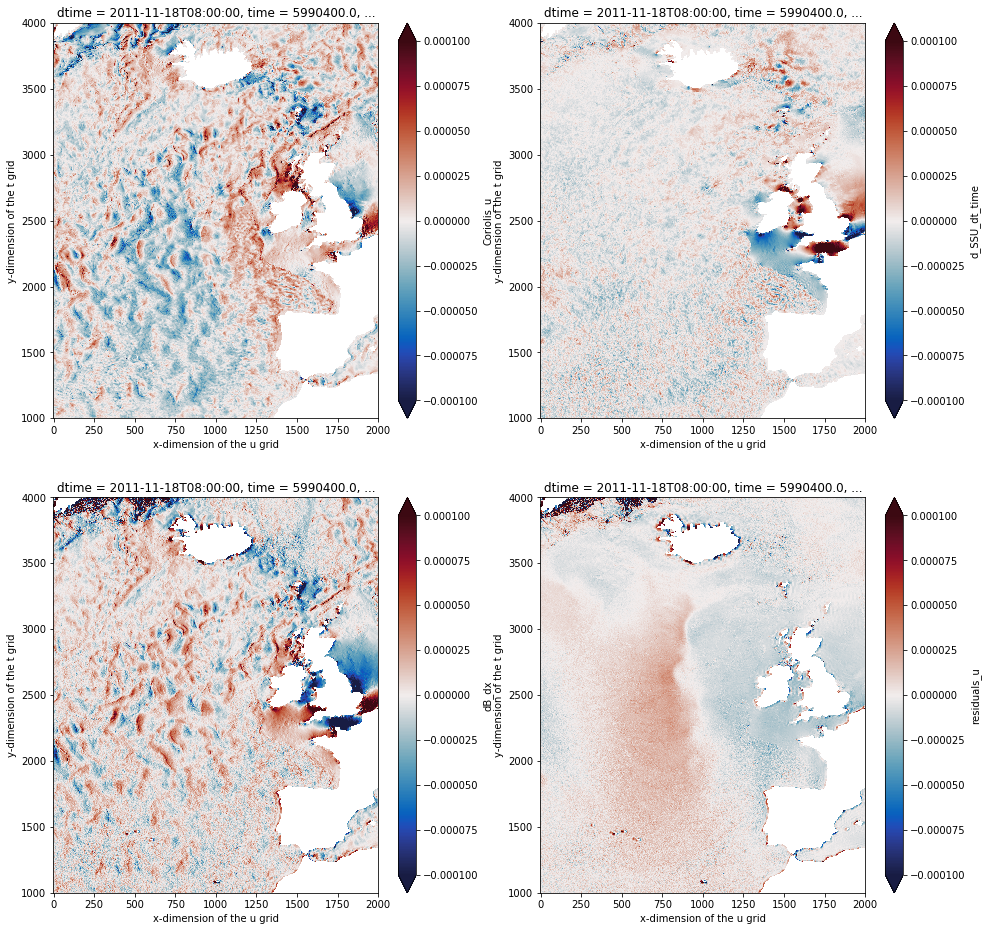

In [54]:
face_plot = 2

fig = plt.figure(figsize = (16,16))

plt.subplot(221)
ds['Coriolis_u'].isel(face= face_plot,time=80, i=slice(0,2000), j=slice(1000,4000)).plot(vmin=-0.0001, vmax=0.0001, cmap = cm.balance)
plt.subplot(222)
ds['d_SSU_dt_time'].isel(face= face_plot,time=80, i=slice(0,2000), j=slice(1000,4000)).plot(vmin=-0.0001, vmax=0.0001, cmap = cm.balance)
plt.subplot(223)
ds['dB_dx'].isel(face= face_plot,time=80, i=slice(0,2000), j=slice(1000,4000)).plot(vmin=-0.0001, vmax=0.0001, cmap = cm.balance)
plt.subplot(224)
ds['residuals_u'].isel(face= face_plot,time=80, i=slice(0,2000), j=slice(1000,4000)).plot(vmin=-0.0001, vmax=0.0001, cmap = cm.balance)

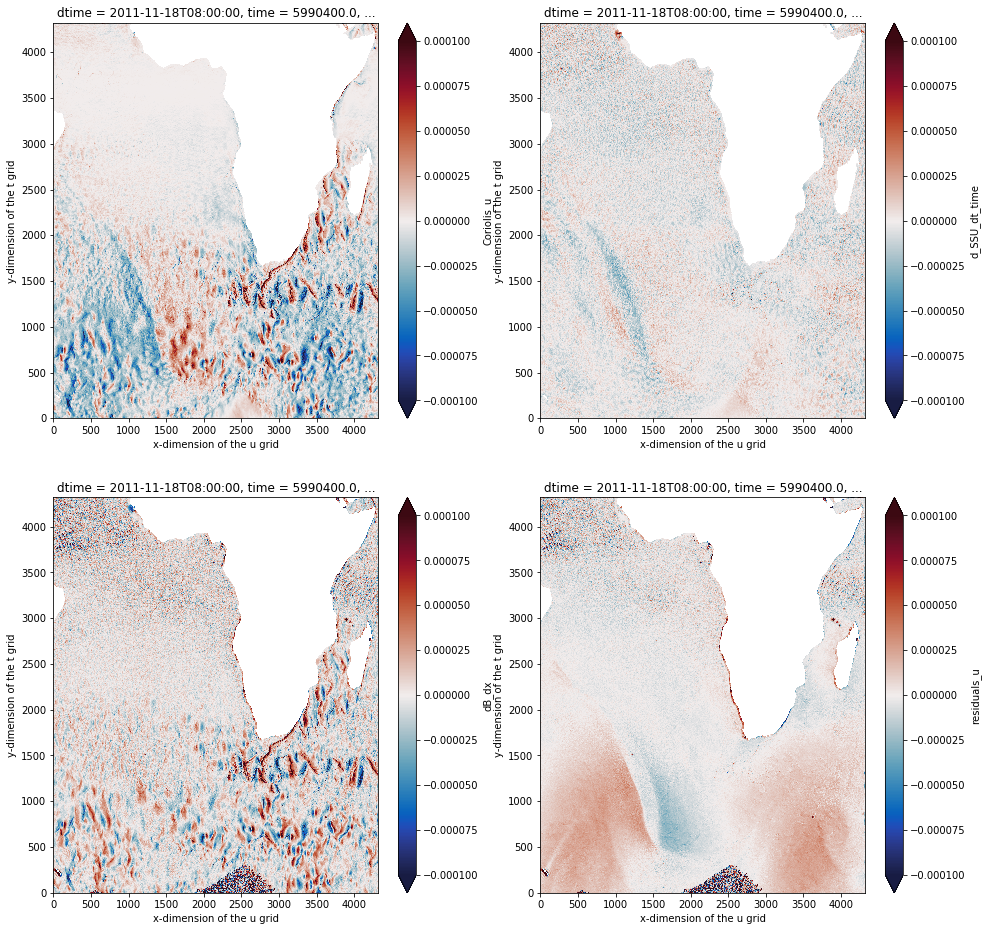

In [55]:
face_plot = 1

fig = plt.figure(figsize = (16,16))

plt.subplot(221)
ds['Coriolis_u'].isel(face= face_plot,time=80).plot(vmin=-0.0001, vmax=0.0001, cmap = cm.balance)
plt.subplot(222)
ds['d_SSU_dt_time'].isel(face= face_plot,time=80).plot(vmin=-0.0001, vmax=0.0001, cmap = cm.balance)
plt.subplot(223)
ds['dB_dx'].isel(face= face_plot,time=80).plot(vmin=-0.0001, vmax=0.0001, cmap = cm.balance)
plt.subplot(224)
ds['residuals_u'].isel(face= face_plot,time=80).plot(vmin=-0.0001, vmax=0.0001, cmap = cm.balance)

In [56]:
def quick_llc_plot(data, axis_off=False, **kwargs):
    face_to_axis = {0: (2, 0), 1: (1, 0), 2: (0, 0),
                    3: (2, 1), 4: (1, 1), 5: (0, 1),
                    7: (0, 2), 8: (1, 2), 9: (2, 2),
                    10: (0, 3), 11: (1, 3), 12: (2, 3)}
    transpose = [7, 8, 9, 10, 11, 12]
    gridspec_kw = dict(left=0, bottom=0, right=4, top=4, wspace=0, hspace=0)
    fig, axes = plt.subplots(nrows=3, ncols=4, gridspec_kw=gridspec_kw)
    for face, (j, i) in face_to_axis.items():
        data_ax = data.isel(face=face)
        ax = axes[j,i]
        yincrease = True
        if face in transpose:
            data_ax = data_ax.transpose()
            yincrease = False
        data_ax.plot(ax=ax, yincrease=yincrease, **kwargs)
        if axis_off:
            ax.axis('off')
        ax.set_title('')

distributed.comm.tcp - WARNING - Closing dangling stream in <TCP local=tcp://10.148.1.24:33842 remote=tcp://10.148.1.24:55110>
distributed.comm.tcp - WARNING - Closing dangling stream in <TCP local=tcp://10.148.1.24:33843 remote=tcp://10.148.1.24:55110>


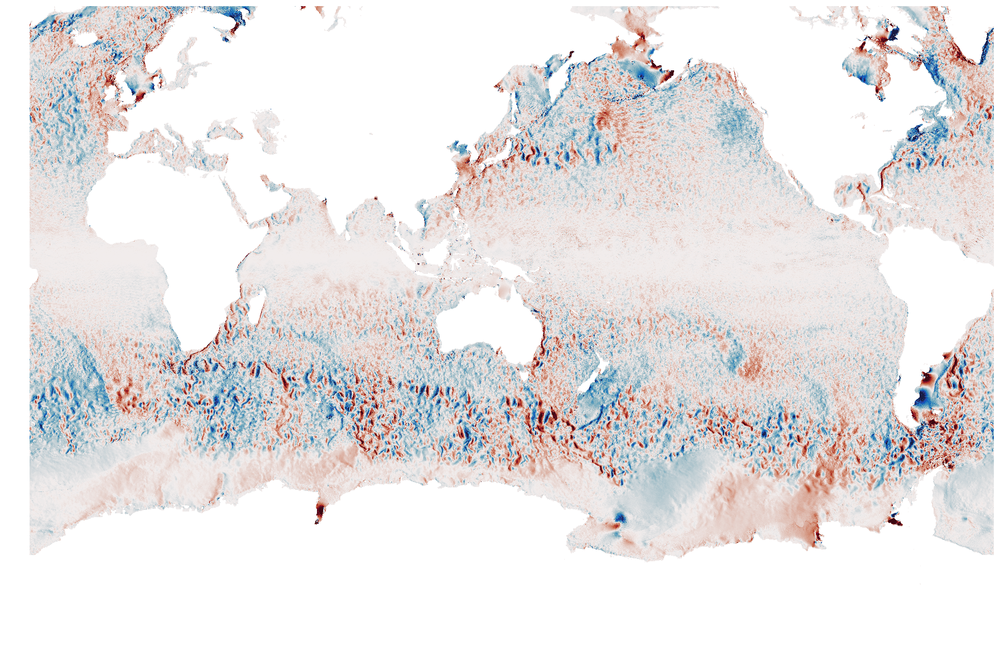

In [57]:
quick_llc_plot(ds['Coriolis_u'].isel(time=80), vmin=-0.0001, vmax=0.0001, add_colorbar=False, axis_off=True, cmap = cm.balance)

distributed.comm.tcp - WARNING - Closing dangling stream in <TCP local=tcp://10.148.1.24:33885 remote=tcp://10.148.1.24:55110>


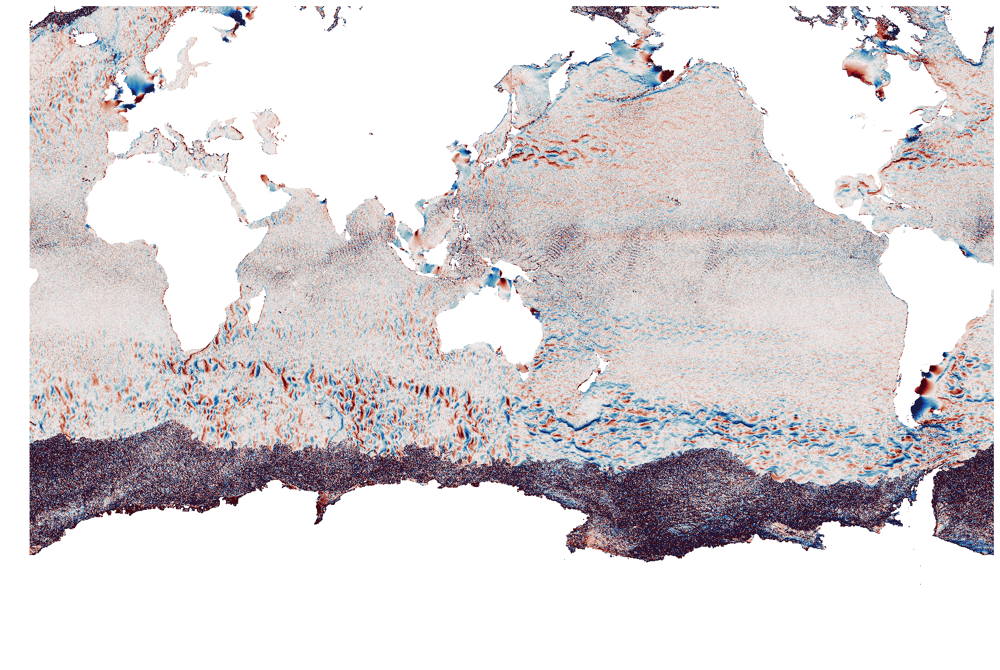

In [58]:
quick_llc_plot(ds['dB_dx'].isel(time=80), vmin=-0.0001, vmax=0.0001, add_colorbar=False, axis_off=True, cmap = cm.balance)

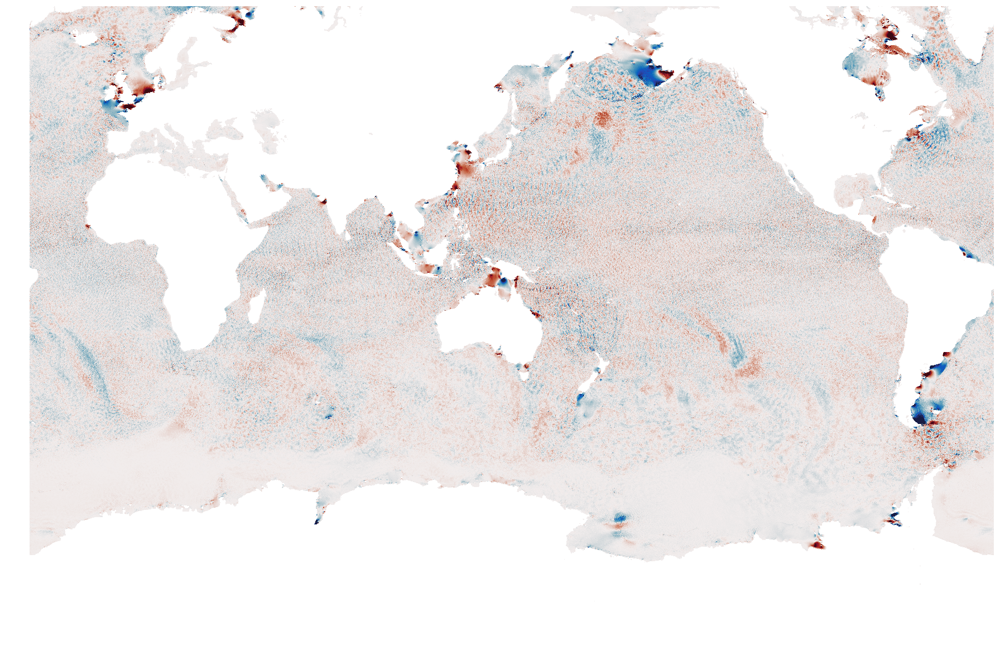

In [59]:
quick_llc_plot(ds['d_SSU_dt_time'].isel(time=80), vmin=-0.0001, vmax=0.0001, add_colorbar=False, axis_off=True, cmap = cm.balance)

In [2]:
face_plot = 2

# std
residuals_u_std = ds['residuals_u'].isel(face=face_plot,i_g=slice(0,1000),j=200.std(['i_g','j']).load()
Coriolis_u_std = ds['Coriolis_u'].isel(face=face_plot,i_g=slice(0,1000),j=slice(1500,2500)).std(['i_g','j']).load()
dB_dx_std = ds['dB_dx'].isel(face=face_plot,i_g=slice(0,1000),j=slice(1500,2500)).std(['i_g','j']).load()
d_SSU_dt_time_std = ds['d_SSU_dt_time'].isel(face=face_plot,i_g=slice(0,1000),j=slice(1500,2500)).std(['i_g','j']).load()

SyntaxError: invalid syntax (<ipython-input-2-285b62781ac4>, line 4)

In [25]:
face_plot = 1

# std
residuals_u = ds['residuals_u'].isel(face=face_plot,i=500,j=4000).load()
Coriolis_u = ds['Coriolis_u'].isel(face=face_plot,i=500,j=4000).load()
dB_dx = ds['dB_dx'].isel(face=face_plot,i=500,j=4000).load()
d_SSU_dt_time = ds['d_SSU_dt_time'].isel(face=face_plot,i=500,j=4000).load()

(-8e-05, 8e-05)

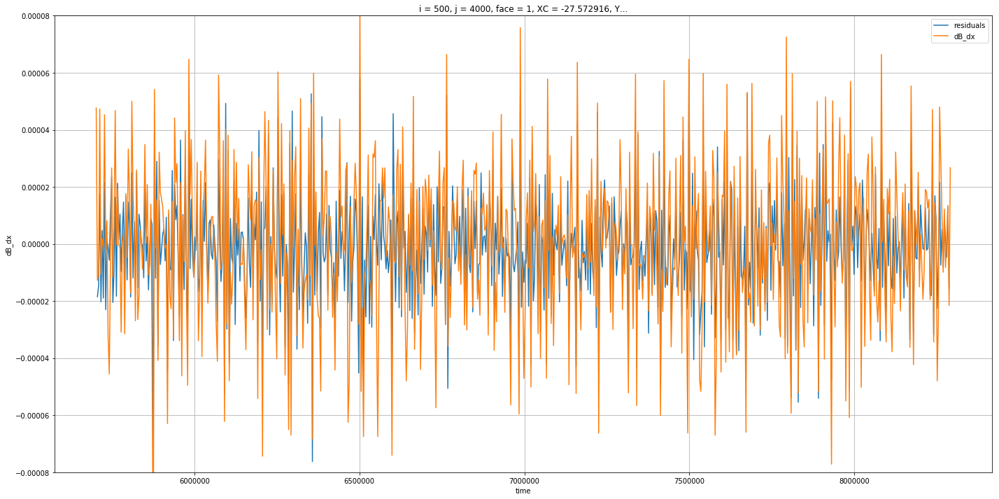

In [32]:
# std
fig, ax = plt.subplots(figsize=(24,12))
labels = ['residuals', 'Coriolis_u','dB_dx','d_SSU_dt_time']

residuals_u.plot(ax=ax, label=labels[0])
#Coriolis_u.plot(ax=ax, label=labels[1])
dB_dx.plot(ax=ax, label=labels[2])
#d_SSU_dt_time.plot(ax=ax, label=labels[3])
ax.legend(); ax.grid()
#ax.set_xlim([0,480])
ax.set_ylim([-8*1e-5,8*1e-5])

In [ ]:
import xrft
nfft = 720  
window = np.hanning(nfft)


u_normal = dB_dx
u_fft_normal = xrft.dft(u_normal.fillna(0.), shift=False, detrend='linear', window=True)
E_u_normal = (u_fft_normal*u_fft_normal.conj()).where(u_fft_normal!=0., drop=False)/2880*3600
E_u_normal = np.real(E_u_normal).rename('u_power_spectrum')


u_normal_2 = Coriolis_u
u_fft_normal_2 = xrft.dft(window*u_normal_2.fillna(0.), shift=False, detrend='linear', window=False)
E_u_normal_2 = (u_fft_normal_2*u_fft_normal_2.conj()).where(u_fft_normal_2!=0., drop=False)/720*3600
E_u_normal_2 = np.real(E_u_normal_2).rename('u_power_spectrum')


u_normal_3 = d_SSU_dt_time
u_fft_normal_3 = xrft.dft(window*u_normal_3.fillna(0.), shift=False, detrend='linear', window=False)
E_u_normal_3 = (u_fft_normal_3*u_fft_normal_3.conj()).where(u_fft_normal_3!=0., drop=False)/720*3600
E_u_normal_3 = np.real(E_u_normal_3).rename('u_power_spectrum')


u_normal_4 = residuals_u
u_fft_normal_4 = xrft.dft(window*u_normal_4.fillna(0.), shift=False, detrend='linear', window=False)
E_u_normal_4 = (u_fft_normal_4*u_fft_normal_4.conj()).where(u_fft_normal_4!=0., drop=False)/720*3600
E_u_normal_4 = np.real(E_u_normal_4).rename('u_power_spectrum')



labels = ['dB_dx', 'Coriolis_u','d_SSU_dt_time','residuals_u']


fig, ax = plt.subplots(figsize=(21,12))

E_u_normal.where(E_u_normal.freq_time>0).plot(ax=ax, label=labels[0],color='k')
#E_u_normal_2.where(E_u_normal_2.freq_time>0).plot(ax=ax, label=labels[1],color='r')
#E_u_normal_3.where(E_u_normal_3.freq_time>0).plot(ax=ax, label=labels[2])
E_u_normal_4.where(E_u_normal_4.freq_time>0).plot(ax=ax, label=labels[3],color='b')



ax.legend(); ax.grid()
ax.set_xscale('log'); ax.set_yscale('log')
ax.set_ylabel(''); 

ax.set_xlim([1e-7,2*1e-4])
ax.set_ylim([1e-12,1e-4])
ax.plot([1/12.42/3600,1/12.42/3600],[1e-12,1e-4],'k--') 
ax.plot([1/24/3600,1/24/3600],[1e-12,1e-4],'k--')


In [13]:
cluster.scheduler.close()

<Future finished result=None>